In [365]:
using SparseArrays, Plots, Random, LinearAlgebra, Arpack, LaTeXStrings, Distributions

## Introduction

In this Jupyter notebook, we use a specific construction of the graph Laplacian operator to approximate the
Laplacian differential operator on arbitrary domains. Visually, we find that the eigenvectors of the graph Laplacian form a good approximation to the eigenfunctions of the Laplacian operator. Numerically, we find that the eigenvectors of the graph Laplacian do appear to converge to the eigenfunctions of the Laplacian operator, albeit slowly. With this understanding, we investigate the eigenvectors of the graph Laplacian on an exotic L-shaped domain; these should serve as a good approximation to the eigenfunctions of the Laplacian operator on this domain.

## Part 1

Let $\Omega = [0, 1]^2 \subset \mathbb{R}^2$ and let $x_1, \ldots, x_m$ be uniformly distributed random points in $\Omega$. We define $X = \{x_1, \ldots, x_m\}$ to be our set of scattered data points and define the weighted graph $G = \{X, W\}$ with the weight matrix $W \in \mathbb{R}^{m\times m}$ as
$$w_{ij} = \kappa_\varepsilon(\|x_i-x_j\|_2),$$
where $$\kappa_\varepsilon(t) = \begin{cases}(\pi\varepsilon^2)^{-1} & t\leq \varepsilon,\\0 & t > \varepsilon.\end{cases}$$
The parameter $\varepsilon>0$ controls the bandwidth of the kernel $\kappa$ and in turn the local connectivity of the graph $G$. We consider $\varepsilon = C\log(m)^{3/4}m^{-1/2}$, where $C=1$. Let $L = D - W$ be the unnormalized graph Laplacian matrix of $G$ and fix $m=2048$.

In [446]:
C = 1.; m = 2048;

Here, we write a function which given a set of points, will generate the first $k$ eigenvectors of $L$ corresponding to our choice of weight function. 

In [447]:
function kevecs(xmat,k)
    m = size(xmat,2)
    ϵ = C*log(m)^(3/4)/√m;
    
    w(x,y) = norm(x-y)<=ϵ ? 1/(π*ϵ^2) : 0
    W = sparse(zeros(m,m));
    for i = 1:m
        for j = i:m
            W[i,j] = w(xmat[:,i],xmat[:,j])
            W[j,i] = W[i,j]
        end
    end
    
    D = sparse(diagm(W*ones(m)));
    L = D-W;
    
    (~,evecs)=eigs(L, nev=k, which=:SM)
    evecs
end

kevecs (generic function with 1 method)

For a fixed random seed, let's generate our points, compute the first four eigenvectors, and plot them.

In [453]:
Random.seed!(123);
xmat = rand(2,m);

In [454]:
evecs = kevecs(xmat,4)
q₁ = evecs[:,1];
q₂ = evecs[:,2];
q₃ = evecs[:,3];
q₄ = evecs[:,4];

Note that these plots may flip sign when the code is rerun because the sparse eigenvector calculator ARPACK.jl does not consistently pick the same sign for the eigenvectors.

We first plot the eigenvector $q_1$ corresponding to the smallest eigenvalue.

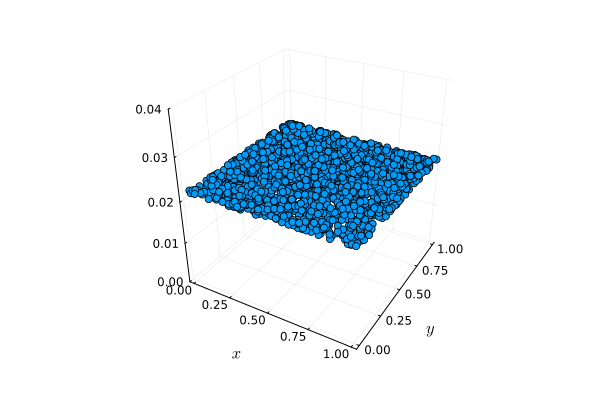

In [455]:
plot(xmat[1,:],xmat[2,:],q₁,label=:false,zlim=(0,0.04),xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Now, we plot the eigenvector $q_2$ corresponding to the second smallest eigenvalue.

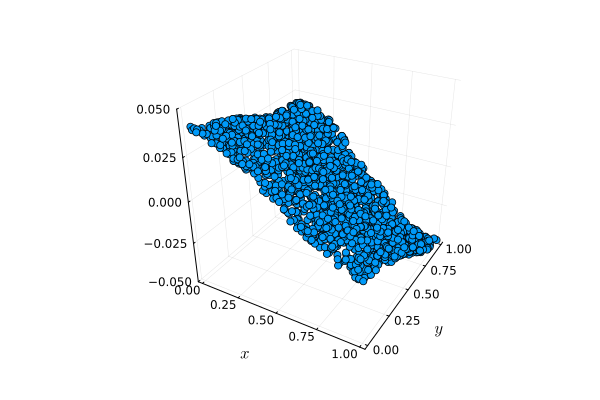

In [456]:
plot(xmat[1,:],xmat[2,:],q₂,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

Now, we plot the eigenvector $q_3$ corresponding to the third smallest eigenvalue.

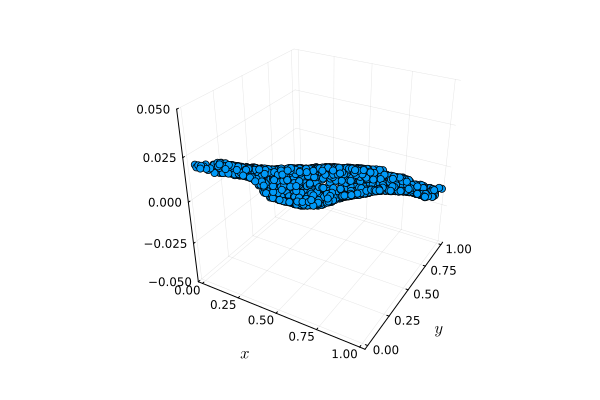

In [457]:
plot(xmat[1,:],xmat[2,:],q₃,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

Finally, we plot the eigenvector $q_4$ corresponding to the fourth smallest eigenvalue.

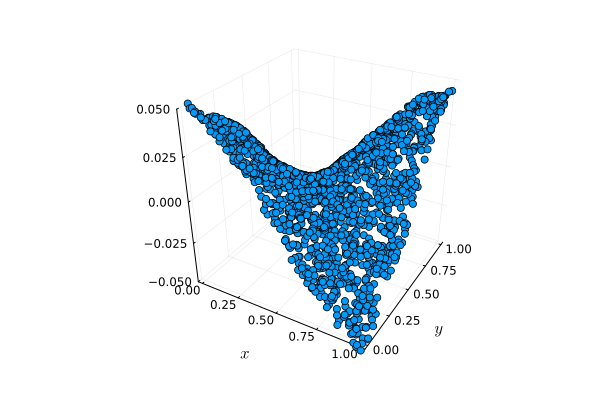

In [458]:
plot(xmat[1,:],xmat[2,:],q₄,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

## Part 2

Now consider the Laplacian differential operator
$$
\mathcal{L} f \mapsto -\frac{\partial^2 f}{\partial x_1^2} - \frac{\partial^2 f}{\partial x_2^2},
$$
that is well-defined for functions $f: \Omega \rightarrow \mathbb{R}$ that are twice continuously differentiable, i.e., $f \in C^2(\Omega)$. We observe that for integers $n,k \geq 0$, the functions
$$
\psi(x) = \cos(n\pi x_1) \cos(k\pi x_2),
$$
solve the Neumann eigenvalue problem for the operator $\mathcal{L}$, i.e.,
$$
\mathcal{L} \psi = \lambda(n,k) \psi, \quad \nabla \psi \cdot n = 0, \quad \text{on } \partial \Omega,
$$
where $n$ denotes the outward unit normal vector on the boundary of $\Omega$.

Now let $q_1, \dots, q_4 \in \mathbb{R}^m$ be the eigenvectors of the graph Laplacian $L$ as computed in part 1, and define the vectors $\psi_1, \dots, \psi_4 \in \mathbb{R}^m$ as follows:
$$
\psi_j = \widetilde{\psi}_j / \|\widetilde{\psi}_j\|_2,
$$
where the entries of $\widetilde{\psi}_j$ contain the point values of the first four eigenfunctions $\psi(x)$, at the vertices $X$. In the following, we produce and plot $\psi_1,\ldots,\psi_4$.

In [459]:
ψ(n,k) = (x₁,x₂) -> cos(n*π*x₁)*cos(k*π*x₂);

In [460]:
ψ₁ = ψ(0,0).(xmat[1,:],xmat[2,:])
ψ₁ /= (norm(ψ₁))
ψ₂ = ψ(1,0).(xmat[1,:],xmat[2,:])
ψ₂ /= (norm(ψ₂))
ψ₃ = ψ(0,1).(xmat[1,:],xmat[2,:])
ψ₃ /= (norm(ψ₃))
ψ₄ = ψ(1,1).(xmat[1,:],xmat[2,:])
ψ₄ /= (norm(ψ₄));

We first plot the $(0,0)$ eigenfunction.

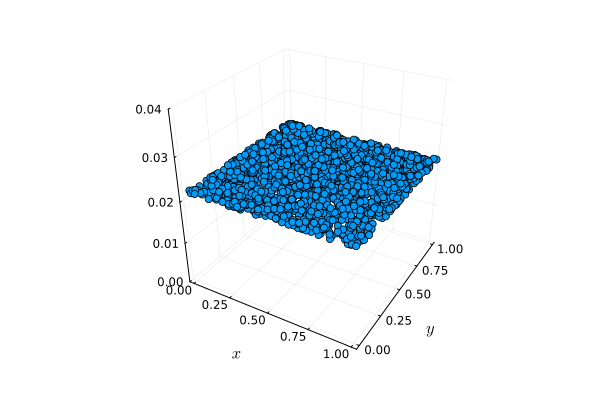

In [461]:
plot(xmat[1,:],xmat[2,:],ψ₁,label=:false,zlim=(0,0.04),xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Now, we plot the $(1,0)$ eigenfunction.

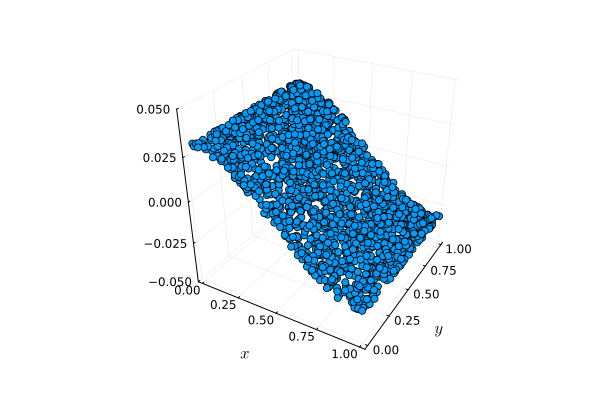

In [463]:
plot(xmat[1,:],xmat[2,:],ψ₂,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

Now, we plot the $(0,1)$ eigenfunction.

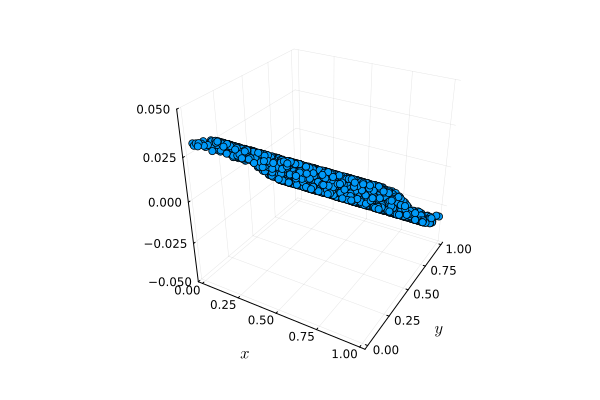

In [465]:
plot(xmat[1,:],xmat[2,:],ψ₃,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

Finally, we plot the $(1,1)$ eigenfunction.

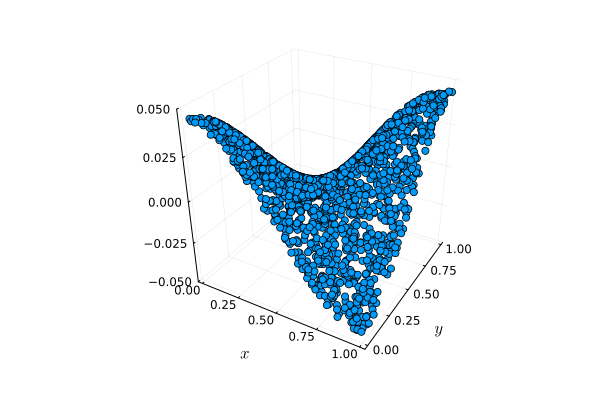

In [466]:
plot(xmat[1,:],xmat[2,:],ψ₄,label=:false,xlabel=L"x",ylabel=L"y",zlim=(-0.05,0.05),seriestype=:scatter, markerstrokealpha=0)

We observe that these essentially look identical to our plots from Part 1. The only caveat is that ARPACK.jl does not choose the signs of the eigenvectors in a consistent way, so the plots from Part 1 may be the negative of those found here. Thus, assuming that our sparse eigenvalue solver chooses the correct sign, it seems that the graph Laplacian is a good approximation to the actual Laplacian.

## Part 3

Now, we reproduce parts 1 and 2 for $m=2^4,\ldots,2^{10}$. To compare the graph Laplacian eigenvectors and Laplacian eigenfunctions, we define the matrices
$$\mathbf{Q} := [q_1 | \cdots | q_4] \in \mathbb{R}^{m \times 4},\quad\boldsymbol{\Psi} := [\psi_1, \cdots , \psi_4] \in \mathbb{R}^{m \times 4},$$
the projectors
$$\mathbf{P}_\mathbf{Q} := \mathbf{Q}\mathbf{Q}^\top,\quad\mathbf{P}_\boldsymbol{\Psi} := \boldsymbol{\Psi}\boldsymbol{\Psi}^\top,$$
and the error
$$\mathrm{error}(m) := |\mathbf{P}_\mathbf{Q} \mathbf{P}_\boldsymbol{\Psi} - \mathbf{P}_{\boldsymbol{\psi}} \mathbf{P}_\mathbf{Q}|_F.$$
We average this error over 30 trials and plot it as a function of $m$ in a loglog plot.

In [467]:
mvec = 2 .^(4:10);
errvec = zeros(7)
for (i,m) in enumerate(mvec)
    for iter = 1:30
        xmat = rand(2,m);

        Q = fourevecs(xmat)

        ψ₁ = ψ(0,0).(xmat[1,:],xmat[2,:])
        ψ₁ /= (norm(ψ₁))
        ψ₂ = ψ(1,0).(xmat[1,:],xmat[2,:])
        ψ₂ /= (norm(ψ₂))
        ψ₃ = ψ(0,1).(xmat[1,:],xmat[2,:])
        ψ₃ /= (norm(ψ₃))
        ψ₄ = ψ(1,1).(xmat[1,:],xmat[2,:])
        ψ₄ /= (norm(ψ₄));
        Ψ = [ψ₁ ψ₂ ψ₃ ψ₄]

        #make sure signs match 
        for j = 1:4
            if sign(Q[1,j])!=sign(Ψ[1,j])
                Q[:,j] *= -1
            end
    end

        PQ = Q*Q'
        PΨ = Ψ*Ψ'
        errvec[i] += norm(PQ*PΨ-PΨ*PQ)/30
    end
end

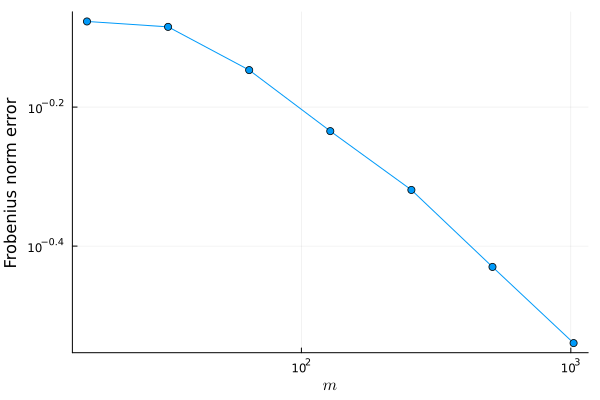

In [470]:
plot(mvec,errvec,xaxis=:log,yaxis=:log,label=:false,markershape=:circle)
xlabel!(L"m")
ylabel!("Frobenius norm error")

We observe that the error is converging, albeit quite slowly.

## Part 4

Now, let $\Omega$ be the L-shpaed domain $$\Omega = ([0,1]^2) \cup ([1,2] \times [0,1]) \cup ([0,1] \times [1,2]).$$
Taking $m=2^{13}$, we compute and plot $q_7,\ldots,q_{10}$ which hopefully approximate the 7th through 10th eigenfunctions well.

In [410]:
# generate points in the L-shaped region
m = 2^13

# Generate random points using rejection sampling
xmatL = zeros(2,m)
count = 0
while count < n_points_total
    x, y = rand(Uniform(0, 2)), rand(Uniform(0, 2))
    if (x < 1 || x > 2) || (y < 1)
        count += 1
        xmatL[:, count] = [x, y]
    end
end

In [415]:
evecsL = kevecs(xmatL,10)
q₇ = evecsL[:,7]
q₈ = evecsL[:,8]
q₉ = evecsL[:,9]
q₀ = evecsL[:,10];

We first plot the eigenvector $q_7$ corresponding to the seventh smallest eigenvalue.

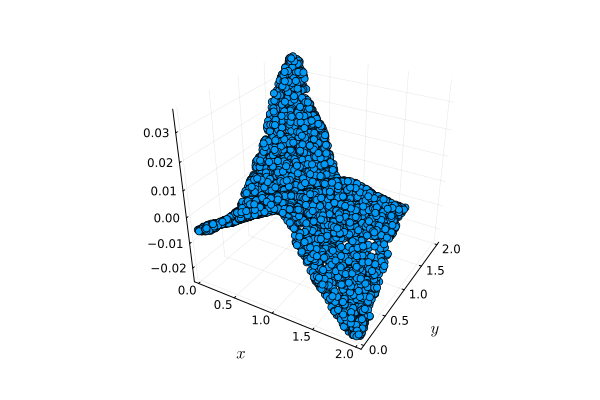

In [430]:
plot(xmatL[1,:],xmatL[2,:],q₇,label=:false,xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Now, we plot the eigenvector $q_8$ corresponding to the eighth smallest eigenvalue.

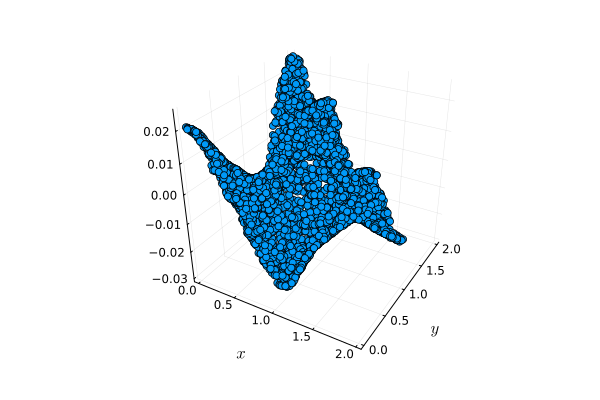

In [431]:
plot(xmatL[1,:],xmatL[2,:],q₈,label=:false,xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Now, we plot the eigenvector $q_9$ corresponding to the ninth smallest eigenvalue.

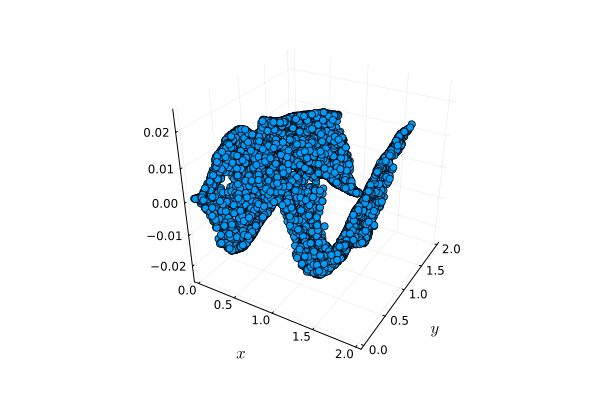

In [432]:
plot(xmatL[1,:],xmatL[2,:],q₉,label=:false,xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Finally, we plot the eigenvector $q_{10}$ corresponding to the tenth smallest eigenvalue.

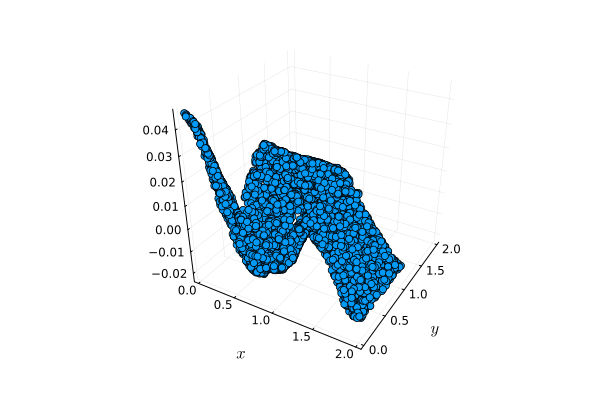

In [433]:
plot(xmatL[1,:],xmatL[2,:],q₀,label=:false,xlabel=L"x",ylabel=L"y",seriestype=:scatter, markerstrokealpha=0)

Based on the results of the first three parts, we expect that these eigenvectors are good approximations to the eigenfunctions of the Laplacian operator on the L-shaped domain.